<a href="https://colab.research.google.com/github/AdamTCollins/CS4076_PROJECT/blob/main/CS4287_Assign2_21340633_21332967.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://colab.research.google.com/github/CraigPhayer/CS4287-CNN/blob/main/CS4287-Assign2-21340633-21332967.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### CS4287 Assignment 2 - Convolutional Neural Networks (CNNs)

Craig Phayer: 21340633

Adam Collins: 21332967

The code executes to the end without an error.


**Sources Cited:**

InceptionV3

   - TensorFlow: https://www.tensorflow.org/api_docs/python/tf/keras/applications/InceptionV3
    
   - GeeksForGeeks: https://www.geeksforgeeks.org/inception-v2-and-v3-inception-network-versions/?ref=header_outind
    

ResNet-50

   - TensorFlow: https://www.tensorflow.org/api_docs/python/tf/keras/applications/ResNet50
    
   - Kaggle: https://www.kaggle.com/code/nurlantalibov/97-accuracy-transfer-learning-catvsdog
    
   - YouTube: https://www.youtube.com/watch?v=5SJAPmQy7xs

In [2]:
# Imports

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import InceptionV3
import tensorflow as tf
import shutil
import pandas as pd
from keras.utils import image_dataset_from_directory
from pathlib import Path
import kagglehub
import glob
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2
from collections import Counter
import warnings
from tensorflow.keras.applications.resnet50 import preprocess_input
from sklearn.utils import compute_class_weight
import numpy as np

# Suppressing TensorFlow's informational and warning logs to avoid output clutter.
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
tf.get_logger().setLevel('ERROR')

### 1. The Dataset


#### (a). Visualisation of some of the key attributes.


In [3]:
# Downloading the Yu-Gi-Oh Database dataset from Kaggle and returning its local path.
dataset_path = Path(kagglehub.dataset_download("archanghosh/yugioh-database"))

# Printing the path to the downloaded dataset.
print("Path to Dataset files:", dataset_path)

# Defining the path to the metadata CSV file within the dataset.
metadata_path = dataset_path / "Yugi_db_cleaned.csv"

# Loading the metadata CSV file into a Pandas DataFrame and displaying it.
df = pd.read_csv(metadata_path)
df

100%|██████████| 5.35G/5.35G [04:27<00:00, 21.4MB/s]

Extracting files...


Path to Dataset files: /root/.cache/kagglehub/datasets/archanghosh/yugioh-database/versions/4


,Image_name,Card-set,Card_number,Rarity,Card_name,Other names,Card type,Attribute,Types,Level,...,Effect types,Ritual required,Property,Ritual Monster required,Pendulum Scale,Rank,Link Arrows,ATK / LINK,Other names (Japanese),Summoned by the effect of
0,MRD-116 R.png,Metal Raiders,MRD-116,Rare,Witch of the Black Forest,NaN,Monster,DARK,Spellcaster / Effect,4.0,...,"['Trigger', 'Condition']",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,PHSW-EN014 C.png,Photon Shockwave,PHSW-EN014,Common,Plasma Ball,NaN,Monster,LIGHT,Thunder / Effect,3.0,...,"['Continuous', 'Trigger']",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ROTD-EN030 UR.png,Rise of the Duelist,ROTD-EN030,Ultra Rare,Koa'ki Meiru Supplier,NaN,Monster,EARTH,Rock / Effect,4.0,...,"['Trigger', 'Trigger', 'Condition']",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PGD-093 R.png,Pharaonic Guardian,PGD-093,Rare,Coffin Seller,NaN,Trap,NaN,NaN,NaN,...,['Trigger-like'],NaN,Continuous,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,RIRA-EN060 C.png,Rising Rampage,RIRA-EN060,Common,"Elborz, the Sacred Lands of Simorgh",NaN,Spell,NaN,NaN,NaN,...,"['Continuous-like', 'Condition', 'Ignition-lik...",NaN,Field,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8368,TDIL-EN004 C.png,The Dark Illusion,TDIL-EN004,Common,Performapal Inflater Tapir,NaN,Monster,WIND,Beast / Effect,6.0,...,"['Quick', 'Trigger', 'Condition']",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8369,LODT-EN039 R.png,Light of Destruction,LODT-EN039,Rare,"Simorgh, Bird of Ancestry",NaN,Monster,WIND,Winged Beast / Effect,8.0,...,"['Continuous', 'Trigger', 'Unclassified']",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8370,DAMA-EN066 ScR.png,Dawn of Majesty,DAMA-EN066,Secret Rare,Ready Fusion,NaN,Spell,NaN,NaN,NaN,...,"['Cost', 'Effect', 'Condition']",NaN,Normal,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8371,MACR-EN079 ScR.png,Maximum Crisis,MACR-EN079,Secret Rare,Unending Nightmare,NaN,Trap,NaN,NaN,NaN,...,"['Quick-like', 'Condition']",NaN,Continuous,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Number of unique classes: 3
Classes: ['Monster' 'Trap' 'Spell']


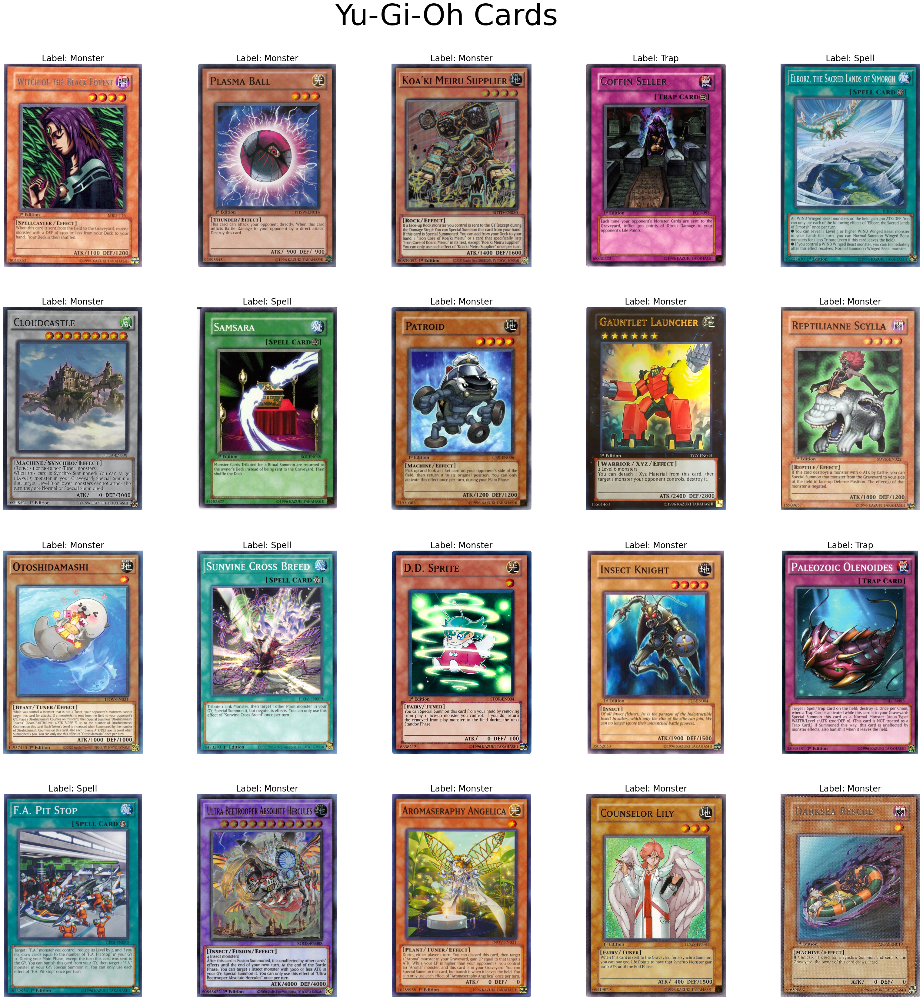

In [4]:
# Extracting the unique card types from the DataFrame and counting the number of unique card types.
unique_classes = df['Card type'].unique()
num_classes = len(unique_classes)

# Printing the total number of unique classes and the list of unique classes.
print(f"Number of unique classes: {num_classes}")
print(f"Classes: {unique_classes}")

# Defining the directory path where the card images are stored.
image_dir = dataset_path / "Yugi_images"

# Initialize lists for images and labels
images = []
labels = []

# Looping through all image files in the directory with the .png extension.
# Using OpenCV to read each image and append it to the list, along with its label.
i = 0
for _, row in df.iterrows():
    img_path = image_dir / row['Image_name']
    if img_path.exists():
        images.append(cv2.imread(str(img_path)))
        labels.append(row['Card type'])
        i += 1
        if i == 20:
            break

# Creating the grid to display the images and their labels.
plt.figure(figsize=(40, 40))
columns = 5

# Looping through each of the loaded images for plotting, creating a new subplot for each image.
for i, (image, label) in enumerate(zip(images, labels)):
    axs = plt.subplot(int(len(images) / columns), columns, i + 1)
    axs.axis("off")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Label: {label}", fontsize=20)

# Adding a main title for the entire grid.
plt.suptitle("Yu-Gi-Oh Cards", fontsize=70, y=0.93)
plt.show()

# Suppressing stderr warning to avoid output clutter.
warnings.filterwarnings("ignore", category=UserWarning)

In [5]:
# Defining the directory where the organized images will be stored.
output_dir = dataset_path / "organized_images"

# Getting the unique card types from the DataFrame.
unique_classes = df['Card type'].unique()

# Creating a subdirectory for each unique card type in the output directory.
for class_name in unique_classes:
    (output_dir / class_name).mkdir(parents=True, exist_ok=True)

# Looping through each row in the DataFrame to organize the images.
for _, row in df.iterrows():
    # Getting the image name and card type for the current row.
    image_name = row['Image_name']
    class_name = row['Card type']

    # Defining the source and destination path.
    source_path = image_dir / image_name
    destination_path = output_dir / class_name / image_name

    # Checking if the source image already exists in order to avoid any errors.
    if source_path.exists():
        # Copying the image from the source to the destination path.
        shutil.copy(str(source_path), str(destination_path))

# Confirming that all images are organized successfully.
print("Images successfully organized into class subdirectories.")

Images successfully organized into class subdirectories.


Total Number of Images: 8373


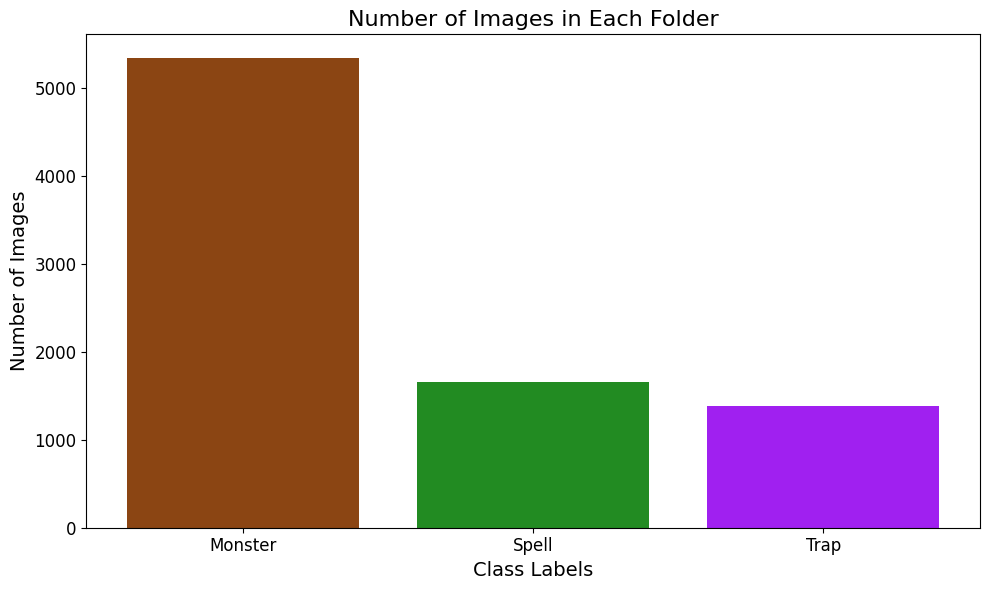

In [6]:
# Visualising how many images are in each card folder.
# Using a dictionary to store class labels and their image counts.
class_counts = Counter()

# Looping through each class folder and counting the number of images.
total_images = 0
for class_folder in output_dir.iterdir():
    if class_folder.is_dir():
        # Counting the number of images in this class folder.
        image_count = len(list(class_folder.glob("*.png")))
        class_counts[class_folder.name] = image_count
        total_images += image_count

# Ensuring the bar chart appears in the order: Monster, Spell, Trap.
ordered_classes = ["Monster", "Spell", "Trap"]
ordered_counts = [class_counts.get(cls, 0) for cls in ordered_classes]

# Defining custom colours for each class.
custom_colours = {
    "Monster": "#8B4513",
    "Spell": "#228B22",
    "Trap": "#A020F0"
}
bar_colours = [custom_colours[cls] for cls in ordered_classes]

# Printing the total number of images.
print(f"Total Number of Images: {total_images}")

# Plotting the bar chart
plt.figure(figsize=(10, 6))
plt.bar(ordered_classes, ordered_counts, color=bar_colours)
plt.xlabel('Class Labels', fontsize=14)
plt.ylabel('Number of Images', fontsize=14)
plt.title('Number of Images in Each Folder', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

In [7]:
# Defining the size to which images will be resized for model input.
IMG_SIZE = (299, 299)

# Creating the training dataset from the organized image directory.
train_ds = image_dataset_from_directory(
    output_dir,
    labels="inferred",
    label_mode="categorical",
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=IMG_SIZE,
    batch_size=32,
    color_mode='rgb'
)

# Creating the validation dataset from the organized image directory.
val_ds = image_dataset_from_directory(
    output_dir,
    labels="inferred",
    label_mode="categorical",
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=IMG_SIZE,
    batch_size=32,
    color_mode='rgb'
)

# Extracting and displaying the class names from the dataset
class_names = train_ds.class_names

# Printing confirmation messages.
print("Training and validation datasets successfully created.")
print(f"Classes in dataset: {class_names}")

Found 8373 files belonging to 3 classes.
Using 6699 files for training.
Found 8373 files belonging to 3 classes.
Using 1674 files for validation.
Training and validation datasets successfully created.
Classes in dataset: ['Monster', 'Spell', 'Trap']


In [8]:
for images, labels in train_ds.take(1):
    print(f"Batch shape (images): {images.shape}")
    print(f"Batch shape (labels): {labels.shape}")

Batch shape (images): (32, 299, 299, 3)
Batch shape (labels): (32, 3)


#### (c.) Any pre-processing such as normalisation applied to the data.

In [9]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomContrast(0.2),
    tf.keras.layers.RandomTranslation(0.2, 0.2)
])

def augment(image, label):
    return data_augmentation(image), label

train_ds = train_ds.map(augment, num_parallel_calls=tf.data.AUTOTUNE)

train_ds = train_ds.map(lambda x, y: (data_augmentation(x), y), num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.map(lambda x, y: (preprocess_input(x), y), num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.map(lambda x, y: (preprocess_input(x), y), num_parallel_calls=tf.data.AUTOTUNE)

train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

y_train = np.concatenate([np.argmax(y.numpy(), axis=1) for _, y in train_ds])
class_weights = compute_class_weight('balanced', classes=np.arange(len(class_names)), y=y_train)
class_weights = {i: class_weights[i] for i in range(len(class_weights))}
print(f"Class weights: {class_weights}")

print(f'Train dataset shape: {train_ds.element_spec}')
print(f'Validation dataset shape: {val_ds.element_spec}')

Class weights: {0: 0.5252881674900024, 1: 1.6701570680628273, 2: 2.00990099009901}
Train dataset shape: (TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 3), dtype=tf.float32, name=None))
Validation dataset shape: (TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 3), dtype=tf.float32, name=None))


### InceptionV3

In [ ]:
from keras.optimizers import RMSprop, Adam, SGD
from keras import regularizers
from tensorflow.keras import layers


def inceptionV3_model(optimizer='Adam', learning_rate=0.001, frozen=True):

    # Model preparation
    base_model = InceptionV3(input_shape=(299, 299, 3), include_top=False, weights="imagenet")

    # Init freeze all layers
    for layer in base_model.layers:
        layer.trainable = not frozen


    x = layers.GlobalAveragePooling2D()(base_model.output)
    output = layers.Dense(3, activation="softmax")(x)

    if optimizer == 'RMSprop':
        optimizer = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'Adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer == 'SGD':
        optimizer = SGD(learning_rate=learning_rate, momentum=0.9)
    else:
        raise ValueError("Unsupported optimizer type. Choose 'RMSprop', 'Adam', or 'SGD'.")

    model = Model(base_model.input, output)

    model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["acc"])
    return model

IV3 = inceptionV3_model()
IV3.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_470 (Conv2D)            (None, 149, 149, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_470 (Batch  (None, 149, 149, 32  96         ['conv2d_470[0][0]']             
 Normalization)                 )                                                           

In [ ]:
IV3_unfrozen = inceptionV3_model(frozen=False)
IV3_unfrozen.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 299, 299, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_282 (Conv2D)       │ (None, 149, 149, 32)   │            864 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_282   │ (None, 149, 149, 32)   │             96 │ conv2d_282[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_282            │ (None, 149, 149, 32)   │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_283 (Conv2D)       │ (None, 147, 147, 32)   │          9,216 │ activation_282[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_283   │ (None, 147, 147, 32)   │             96 │ conv2d_283[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_283            │ (None, 147, 147, 32)   │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_284 (Conv2D)       │ (None, 147, 147, 64)   │         18,432 │ activation_283[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_284   │ (None, 147, 147, 64)   │            192 │ conv2d_284[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_284            │ (None, 147, 147, 64)   │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_12          │ (None, 73, 73, 64)     │              0 │ activation_284[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_285 (Conv2D)       │ (None, 73, 73, 80)     │          5,120 │ max_pooling2d_12[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_285   │ (None, 73, 73, 80)     │            240 │ conv2d_285[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_285            │ (None, 73, 73, 80)     │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_286 (Conv2D)  

 Total params: 21,808,931 (83.19 MB)

 Trainable params: 21,774,499 (83.06 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [ ]:
IV3_history = IV3.fit(train_ds, validation_data=val_ds, epochs=10)

Epoch 1/10
210/210 [==============================] - 35s 151ms/step - loss: 0.4339 - acc: 0.8436 - val_loss: 0.2594 - val_acc: 0.9200
Epoch 2/10
210/210 [==============================] - 31s 145ms/step - loss: 0.2226 - acc: 0.9358 - val_loss: 0.1815 - val_acc: 0.9576
Epoch 3/10
210/210 [==============================] - 31s 145ms/step - loss: 0.1606 - acc: 0.9587 - val_loss: 0.1459 - val_acc: 0.9654
Epoch 4/10
210/210 [==============================] - 31s 144ms/step - loss: 0.1302 - acc: 0.9670 - val_loss: 0.1286 - val_acc: 0.9695
Epoch 5/10
210/210 [==============================] - 31s 144ms/step - loss: 0.1090 - acc: 0.9730 - val_loss: 0.1150 - val_acc: 0.9731
Epoch 6/10
210/210 [==============================] - 31s 144ms/step - loss: 0.0955 - acc: 0.9776 - val_loss: 0.1054 - val_acc: 0.9713
Epoch 7/10
210/210 [==============================] - 31s 144ms/step - loss: 0.0826 - acc: 0.9813 - val_loss: 0.0973 - val_acc: 0.9731
Epoch 8/10
210/210 [==============================] - 3

In [ ]:
os.makedirs("models", exist_ok=True)

# Save the model
IV3.save("models/IV3_yugioh_inception_model.h5")
print("Model saved successfully")

Model saved successfully


In [ ]:
IV3_history_unfrozen = IV3_unfrozen.fit(train_ds, validation_data=val_ds, epochs=10)

Epoch 1/10
210/210 [==============================] - 89s 400ms/step - loss: 0.0325 - acc: 0.9879 - val_loss: 0.2687 - val_acc: 0.9295
Epoch 2/10
210/210 [==============================] - 83s 391ms/step - loss: 0.0095 - acc: 0.9978 - val_loss: 0.6616 - val_acc: 0.8704
Epoch 3/10
210/210 [==============================] - 83s 392ms/step - loss: 1.1492e-04 - acc: 1.0000 - val_loss: 1.3065e-05 - val_acc: 1.0000
Epoch 4/10
210/210 [==============================] - 82s 386ms/step - loss: 0.0309 - acc: 0.9939 - val_loss: 0.1335 - val_acc: 0.9964
Epoch 5/10
210/210 [==============================] - 83s 391ms/step - loss: 0.0143 - acc: 0.9958 - val_loss: 0.3101 - val_acc: 0.9683
Epoch 6/10
210/210 [==============================] - 83s 392ms/step - loss: 0.0013 - acc: 0.9997 - val_loss: 0.0041 - val_acc: 0.9988
Epoch 7/10
210/210 [==============================] - 83s 392ms/step - loss: 0.0011 - acc: 0.9996 - val_loss: 0.0019 - val_acc: 0.9994
Epoch 8/10
210/210 [===========================

In [ ]:
os.makedirs("models", exist_ok=True)

# Save the model
IV3_unfrozen.save("models/IV3_unfrozen_yugioh_inception_model.h5")
print("Model saved successfully")

Model saved successfully


In [ ]:
import pickle

with open("IV3_history.pkl", "wb") as f:
    pickle.dump(IV3_history.history, f)

with open("IV3_unfrozen_history.pkl", "wb") as f:
    pickle.dump(IV3_history_unfrozen.history, f)

print("Histories saved successfully.")

Histories saved successfully.


In [ ]:
with open("IV3_history.pkl", "rb") as f:
    IV3_frozen_history = pickle.load(f)

print("Loaded frozen training history:", IV3_frozen_history)

with open("IV3_unfrozen_history.pkl", "rb") as f:
    IV3_unfrozen_history = pickle.load(f)

print("Loaded unfrozen training history:", IV3_unfrozen_history)

Loaded frozen training history: {'loss': [0.43394598364830017, 0.22262078523635864, 0.16057145595550537, 0.1302378922700882, 0.10901697725057602, 0.09549159556627274, 0.08264188468456268, 0.07478733360767365, 0.06511875987052917, 0.05924065038561821], 'acc': [0.8435587286949158, 0.9358113408088684, 0.958650529384613, 0.9670100212097168, 0.9729810357093811, 0.9776086211204529, 0.9813405275344849, 0.9817883372306824, 0.9859680533409119, 0.9873115420341492], 'val_loss': [0.2594391703605652, 0.18145036697387695, 0.14591814577579498, 0.12858149409294128, 0.11496470868587494, 0.10539375245571136, 0.09725591540336609, 0.09592662751674652, 0.0922846719622612, 0.08405454456806183], 'val_acc': [0.9199522137641907, 0.9575866460800171, 0.965352475643158, 0.9695340394973755, 0.9731183052062988, 0.9713261723518372, 0.9731183052062988, 0.9743130207061768, 0.9707288146018982, 0.9731183052062988]}
Loaded unfrozen training history: {'loss': [0.03254278749227524, 0.009456234984099865, 0.00011492259363876

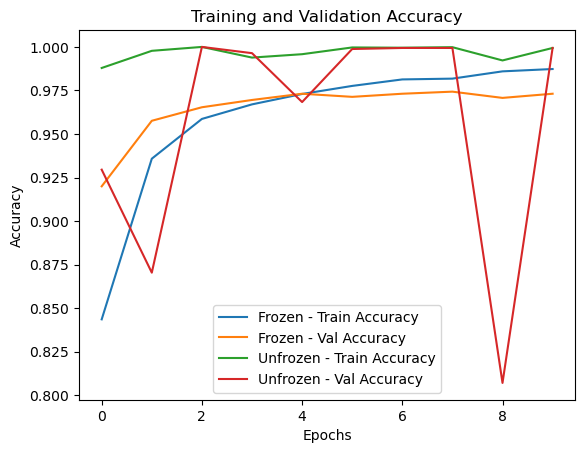

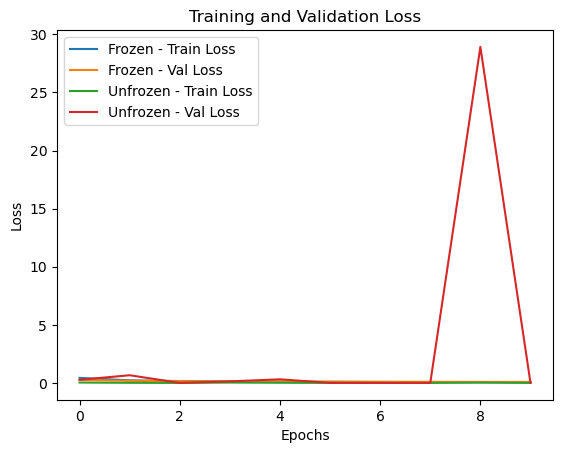

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(IV3_frozen_history['acc'], label='Frozen - Train Accuracy')
plt.plot(IV3_frozen_history['val_acc'], label='Frozen - Val Accuracy')
plt.plot(IV3_unfrozen_history['acc'], label='Unfrozen - Train Accuracy')
plt.plot(IV3_unfrozen_history['val_acc'], label='Unfrozen - Val Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(IV3_frozen_history['loss'], label='Frozen - Train Loss')
plt.plot(IV3_frozen_history['val_loss'], label='Frozen - Val Loss')
plt.plot(IV3_unfrozen_history['loss'], label='Unfrozen - Train Loss')
plt.plot(IV3_unfrozen_history['val_loss'], label='Unfrozen - Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# Frozen Model Predictions
predictions_frozen = IV3.predict(val_ds, verbose=1)
true_labels_frozen = np.concatenate([np.argmax(y.numpy(), axis=1) for _, y in val_ds])

# Unfrozen Model Predictions
predictions_unfrozen = IV3_unfrozen.predict(val_ds, verbose=1)
true_labels_unfrozen = np.concatenate([np.argmax(y.numpy(), axis=1) for _, y in val_ds])

53/53 [==============================] - 7s 109ms/step


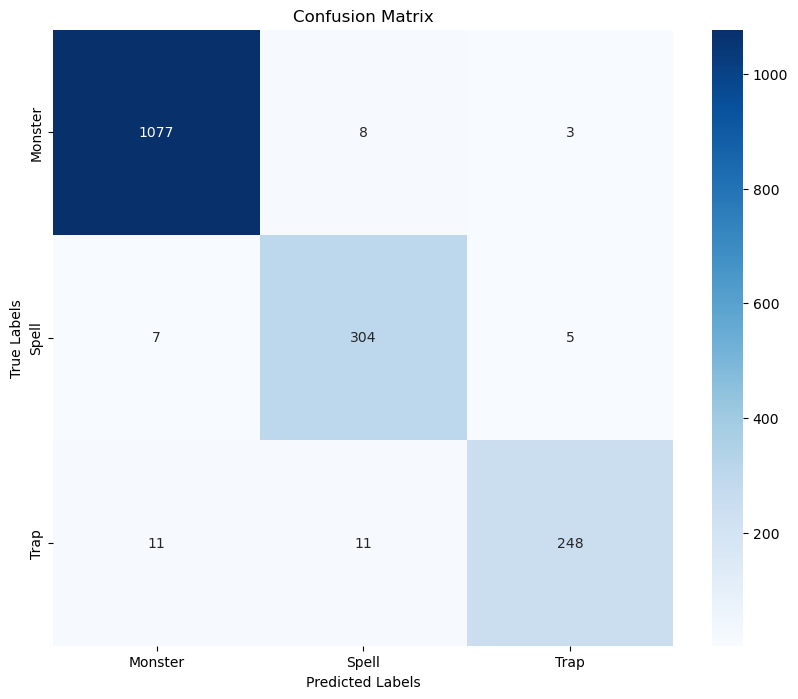

In [ ]:
import seaborn as sns

def plot_matrix(model, dataset, class_names, title='Confusion Matrix'):
    true_labels = []
    pred_labels = []

    for image_batch, label_batch in dataset:
        true_labels.extend(np.argmax(label_batch.numpy(), axis=-1))
        predictions = model.predict(image_batch, verbose=0)
        pred_labels.extend(np.argmax(predictions, axis=1))

    cm = confusion_matrix(true_labels, pred_labels)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()


plot_matrix(IV3, val_ds,class_names)

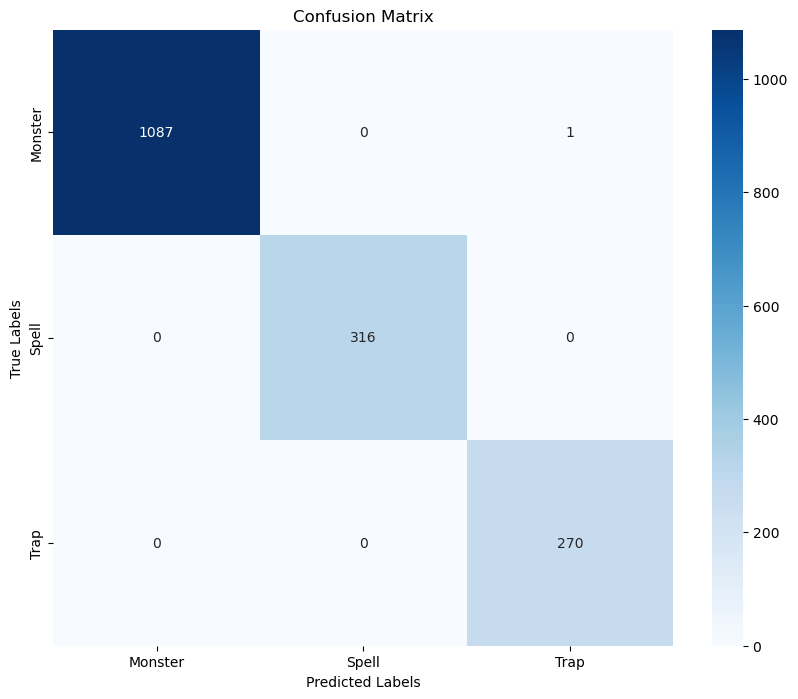

In [ ]:
# Plot for Unfrozen Model
plot_matrix(IV3_unfrozen, val_ds, class_names)

### ResNet-50

In [ ]:
from keras.layers import GlobalAveragePooling2D, Input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, Model, regularizers
from tensorflow.keras.optimizers import Adam, RMSprop, SGD

def resnet50_model(optimizer='Adam', learning_rate=0.0005, frozen=True):
    inputs = Input(shape=(299, 299, 3))

    base_model = ResNet50(weights="imagenet", include_top=False, input_tensor=inputs)

    # init freeze all layers
    for layer in base_model.layers:
        layer.trainable = not frozen

    # Add custom layers
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    outputs = layers.Dense(3, activation="softmax")(x)

    model = Model(inputs=inputs, outputs=outputs)

    # Compile the model
    if optimizer == 'RMSprop':
        optimizer = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'Adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer == 'SGD':
        optimizer = SGD(learning_rate=learning_rate, momentum=0.9)
    else:
        raise ValueError("Unsupported optimizer type. Choose 'RMSprop', 'Adam', or 'SGD'.")

    model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
    return model

# Test the model
ResNet_50 = resnet50_model()
ResNet_50.summary()


Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 305, 305, 3)  0           ['input_8[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 150, 150, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
ResNet_50_unfrozen = resnet50_model(frozen=False)
ResNet_50_unfrozen.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11            │ (None, 299, 299, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 305, 305, 3)    │              0 │ input_layer_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 150, 150, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 150, 150, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 150, 150, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 152, 152, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 75, 75, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 75, 75, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 75, 75, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 75, 75, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 75, 75, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 75, 75, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 75, 75, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 75, 75, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 75, 75, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 23,593,859 (90.00 MB)

 Trainable params: 23,540,739 (89.80 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
ResNet_50_histories = ResNet_50.fit(train_ds, validation_data=val_ds, epochs=15)

Epoch 1/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 55s 202ms/step - accuracy: 0.7932 - loss: 0.5359 - val_accuracy: 0.9600 - val_loss: 0.1636
Epoch 2/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 42s 192ms/step - accuracy: 0.9662 - loss: 0.1367 - val_accuracy: 0.9797 - val_loss: 0.0945
Epoch 3/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - accuracy: 0.9744 - loss: 0.0957 - val_accuracy: 0.9904 - val_loss: 0.0725
Epoch 4/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 42s 191ms/step - accuracy: 0.9816 - loss: 0.0729 - val_accuracy: 0.9910 - val_loss: 0.0586
Epoch 5/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 42s 192ms/step - accuracy: 0.9827 - loss: 0.0648 - val_accuracy: 0.9916 - val_loss: 0.0497
Epoch 6/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - accuracy: 0.9880 - loss: 0.0519 - val_accuracy: 0.9964 - val_loss: 0.0389
Epoch 7/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 42s 192ms/step - accuracy: 0.9904 - loss: 0.0433 - val_accuracy: 0.9934 - val_loss: 0.0398
Epoch 8/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 42s 192ms/step - accuracy: 0.9902 - loss: 0

In [ ]:
os.makedirs("models", exist_ok=True)

# Save the model
ResNet_50.save("models/yugioh_ResNet_50_model.h5")
print("Model saved successfully")

Model saved successfully


In [ ]:
ResNet_50_unfrozen_histories = ResNet_50_unfrozen.fit(train_ds, validation_data=val_ds, epochs=15)

Epoch 1/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 125s 307ms/step - accuracy: 0.9435 - loss: 0.1514 - val_accuracy: 0.7025 - val_loss: 3.9690
Epoch 2/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - accuracy: 0.9875 - loss: 0.0514 - val_accuracy: 0.9898 - val_loss: 0.0452
Epoch 3/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 43s 196ms/step - accuracy: 0.9958 - loss: 0.0168 - val_accuracy: 0.9994 - val_loss: 0.0035
Epoch 4/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - accuracy: 0.9955 - loss: 0.0128 - val_accuracy: 1.0000 - val_loss: 1.3248e-04
Epoch 5/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 43s 196ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.9648 - val_loss: 0.1117
Epoch 6/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 43s 197ms/step - accuracy: 0.9949 - loss: 0.0165 - val_accuracy: 0.9462 - val_loss: 0.3482
Epoch 7/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 43s 197ms/step - accuracy: 0.9948 - loss: 0.0159 - val_accuracy: 0.9994 - val_loss: 8.3400e-04
Epoch 8/15
210/210 ━━━━━━━━━━━━━━━━━━━━ 43s 196ms/step - accuracy: 0.9995 

In [ ]:
os.makedirs("models", exist_ok=True)

# Save the model
ResNet_50_unfrozen.save("models/yugioh_unfrozen_ResNet_50_model.h5")
print("Model saved successfully")

Model saved successfully


In [ ]:
import pickle

with open("ResNet_50_history.pkl", "wb") as f:
    pickle.dump(ResNet_50_histories.history, f)

with open("unfrozen_ResNet_50_unfrozen_history.pkl", "wb") as f:
    pickle.dump(ResNet_50_unfrozen_histories.history, f)

print("Histories saved successfully.")

Histories saved successfully.


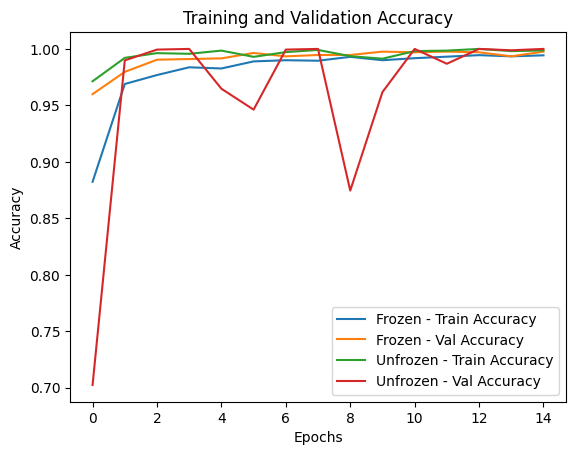

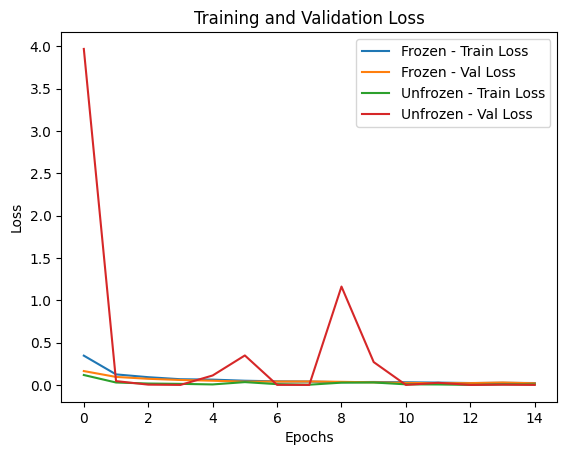

In [ ]:
import matplotlib.pyplot as plt

# Plot accuracy
plt.plot(ResNet_50_histories.history['accuracy'], label='Frozen - Train Accuracy')
plt.plot(ResNet_50_histories.history['val_accuracy'], label='Frozen - Val Accuracy')
plt.plot(ResNet_50_unfrozen_histories.history['accuracy'], label='Unfrozen - Train Accuracy')
plt.plot(ResNet_50_unfrozen_histories.history['val_accuracy'], label='Unfrozen - Val Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

# Plot loss
plt.plot(ResNet_50_histories.history['loss'], label='Frozen - Train Loss')
plt.plot(ResNet_50_histories.history['val_loss'], label='Frozen - Val Loss')
plt.plot(ResNet_50_unfrozen_histories.history['loss'], label='Unfrozen - Train Loss')
plt.plot(ResNet_50_unfrozen_histories.history['val_loss'], label='Unfrozen - Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

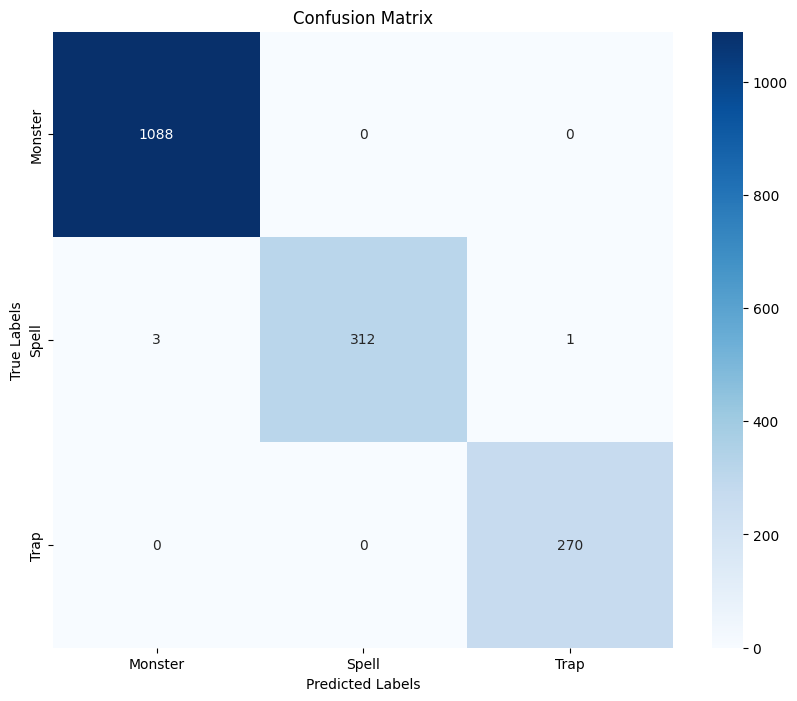

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_matrix(model, dataset, class_names, title='Confusion Matrix'):
    true_labels = []
    pred_labels = []

    for image_batch, label_batch in dataset:
        true_labels.extend(np.argmax(label_batch.numpy(), axis=-1))
        predictions = model.predict(image_batch, verbose=0)
        pred_labels.extend(np.argmax(predictions, axis=1))

    cm = confusion_matrix(true_labels, pred_labels)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

plot_matrix(ResNet_50, val_ds, class_names)

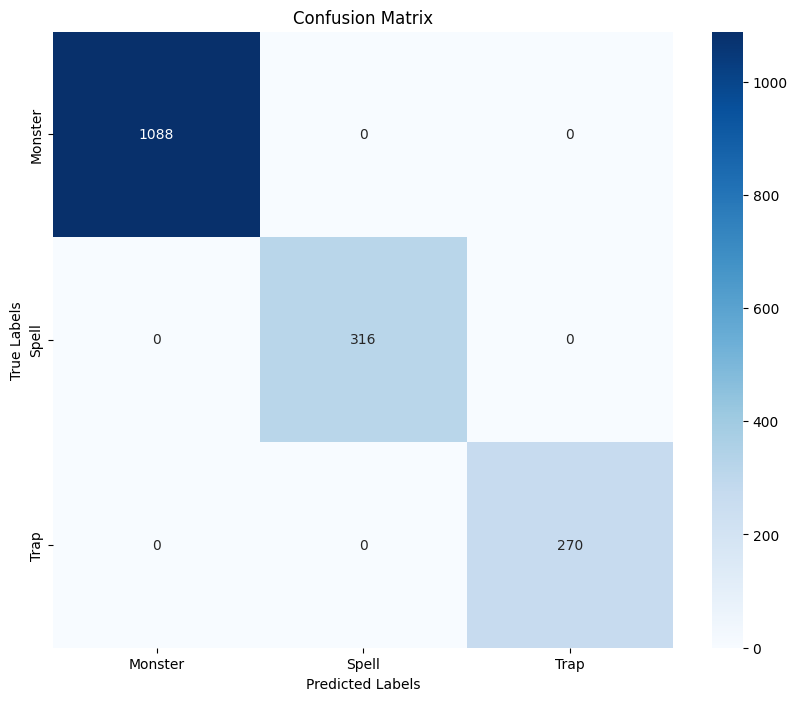

In [ ]:
plot_matrix(ResNet_50_unfrozen, val_ds, class_names)

### K-Fold cross validation

In [ ]:
from keras_preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.applications.inception_v3 import preprocess_input as inception_preprocess
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess

# Constants
IMG_SIZE = (299, 299)
BATCH_SIZE = 32
N_SPLITS = 3
EPOCHS = 10
NUM_CLASSES = len(np.unique(labels))

# Encode labels
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)

def data_generator(image_paths, labels, batch_size, preprocess_fn, augment=False):
    """Generator to load and preprocess data batch-by-batch."""
    from tensorflow.keras.preprocessing.image import ImageDataGenerator

    data_gen = ImageDataGenerator(
        horizontal_flip=True if augment else False,
        rotation_range=10 if augment else 0,
        width_shift_range=0.2 if augment else 0,
        height_shift_range=0.2 if augment else 0,
    )
    while True:
        for i in range(0, len(image_paths), batch_size):
            batch_paths = image_paths[i:i + batch_size]
            batch_labels = labels[i:i + batch_size]

            batch_images = np.array([
                preprocess_fn(
                    img_to_array(load_img(path, target_size=IMG_SIZE))
                ) for path in batch_paths
            ])
            batch_labels = to_categorical(batch_labels, num_classes=NUM_CLASSES)

            yield batch_images, batch_labels

# K-fold
kf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=42)

# Eval results
inception_results = []
resnet_results = []

# Fold histories
inception_histories = []
resnet_histories = []

for fold, (train_idx, val_idx) in enumerate(kf.split(image_paths, encoded_labels)):
    print(f"\nTraining Fold {fold + 1}/{N_SPLITS}...")

    # Split data into training and validation sets
    X_train, X_val = image_paths[train_idx], image_paths[val_idx]
    y_train, y_val = encoded_labels[train_idx], encoded_labels[val_idx]

    # Compute class weights
    class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
    class_weights = {i: class_weights[i] for i in range(len(class_weights))}

    # Create data generators for Inception
    train_gen_inception = data_generator(X_train, y_train, BATCH_SIZE, preprocess_fn=inception_preprocess, augment=True)
    val_gen_inception = data_generator(X_val, y_val, BATCH_SIZE, preprocess_fn=inception_preprocess, augment=False)

    # Create data generators for ResNet
    train_gen_resnet = data_generator(X_train, y_train, BATCH_SIZE, preprocess_fn=resnet_preprocess, augment=True)
    val_gen_resnet = data_generator(X_val, y_val, BATCH_SIZE, preprocess_fn=resnet_preprocess, augment=False)

    # Initialize models using your existing functions
    InceptionV3_model = inceptionV3_model()
    ResNet_model = resnet50_model()

    # Train Inception
    print("Training InceptionV3...")
    inception_history = InceptionV3_model.fit(
        train_gen_inception,
        validation_data=val_gen_inception,
        steps_per_epoch=len(X_train) // BATCH_SIZE,
        validation_steps=len(X_val) // BATCH_SIZE,
        epochs=EPOCHS,
        class_weight=class_weights,
        verbose=1
    )
    inception_histories.append(inception_history.history)
    inception_eval = InceptionV3_model.evaluate(val_gen_inception, steps=len(X_val) // BATCH_SIZE, verbose=1)
    inception_results.append(inception_eval)

    # Train ResNet
    print("Training ResNet50...")
    resnet_history = ResNet_model.fit(
        train_gen_resnet,
        validation_data=val_gen_resnet,
        steps_per_epoch=len(X_train) // BATCH_SIZE,
        validation_steps=len(X_val) // BATCH_SIZE,
        epochs=EPOCHS,
        class_weight=class_weights,
        verbose=1
    )
    resnet_histories.append(resnet_history.history)
    resnet_eval = ResNet_model.evaluate(val_gen_resnet, steps=len(X_val) // BATCH_SIZE, verbose=1)
    resnet_results.append(resnet_eval)


Training Fold 1/3...
Training InceptionV3...
Epoch 1/10
174/174 [==============================] - 64s 358ms/step - loss: 0.6248 - acc: 0.7812 - val_loss: 0.3311 - val_acc: 0.9152
Epoch 2/10
174/174 [==============================] - 55s 316ms/step - loss: 0.3301 - acc: 0.9110 - val_loss: 0.2608 - val_acc: 0.9260
Epoch 3/10
174/174 [==============================] - 54s 309ms/step - loss: 0.2402 - acc: 0.9373 - val_loss: 0.2269 - val_acc: 0.9339
Epoch 4/10
174/174 [==============================] - 53s 309ms/step - loss: 0.1933 - acc: 0.9503 - val_loss: 0.2113 - val_acc: 0.9339
Epoch 5/10
174/174 [==============================] - 53s 304ms/step - loss: 0.1632 - acc: 0.9578 - val_loss: 0.2025 - val_acc: 0.9335
Epoch 6/10
174/174 [==============================] - 54s 310ms/step - loss: 0.1418 - acc: 0.9638 - val_loss: 0.1973 - val_acc: 0.9332
Epoch 7/10
174/174 [==============================] - 52s 303ms/step - loss: 0.1254 - acc: 0.9695 - val_loss: 0.1906 - val_acc: 0.9339
Epoch 8/1

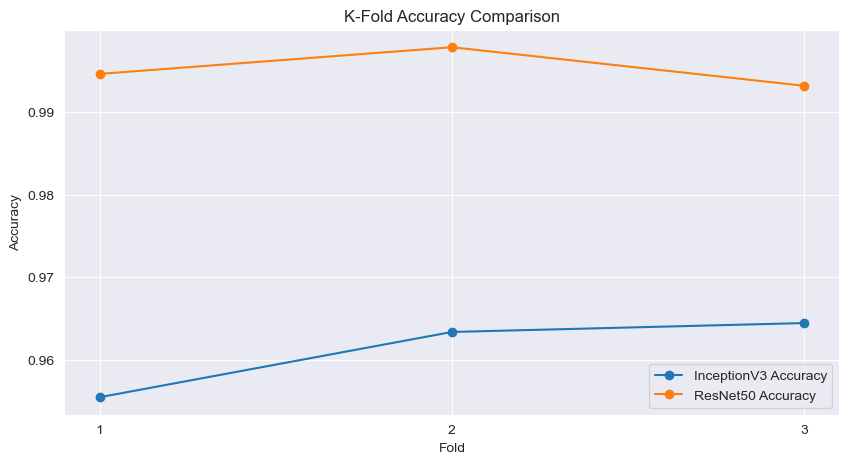

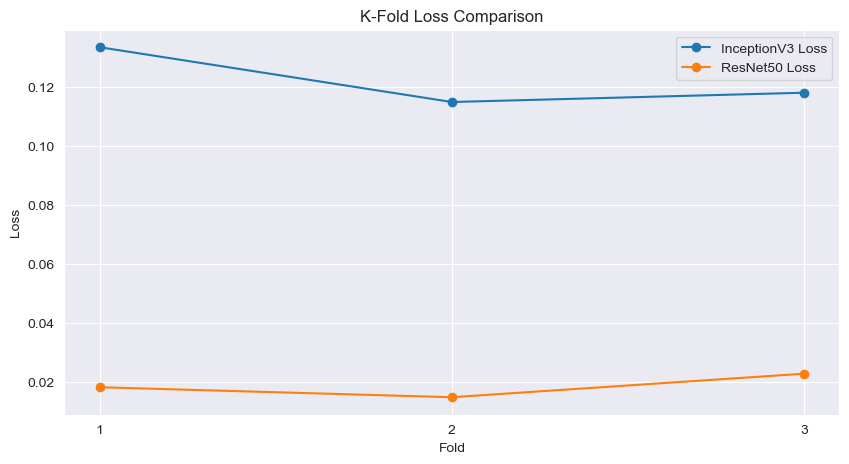

In [ ]:
# Extract accuracy and loss for Inception and ResNet
inception_acc = [result[1] for result in inception_results]
inception_loss = [result[0] for result in inception_results]

resnet_acc = [result[1] for result in resnet_results]
resnet_loss = [result[0] for result in resnet_results]

# Plot accuracy comparison
plt.figure(figsize=(10, 5))
plt.plot(range(1, N_SPLITS + 1), inception_acc, marker='o', label='InceptionV3 Accuracy')
plt.plot(range(1, N_SPLITS + 1), resnet_acc, marker='o', label='ResNet50 Accuracy')
plt.title('K-Fold Accuracy Comparison')
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.xticks(range(1, N_SPLITS + 1))
plt.legend()
plt.grid(True)
plt.show()

# Plot loss comparison
plt.figure(figsize=(10, 5))
plt.plot(range(1, N_SPLITS + 1), inception_loss, marker='o', label='InceptionV3 Loss')
plt.plot(range(1, N_SPLITS + 1), resnet_loss, marker='o', label='ResNet50 Loss')
plt.title('K-Fold Loss Comparison')
plt.xlabel('Fold')
plt.ylabel('Loss')
plt.xticks(range(1, N_SPLITS + 1))
plt.legend()
plt.grid(True)
plt.show()

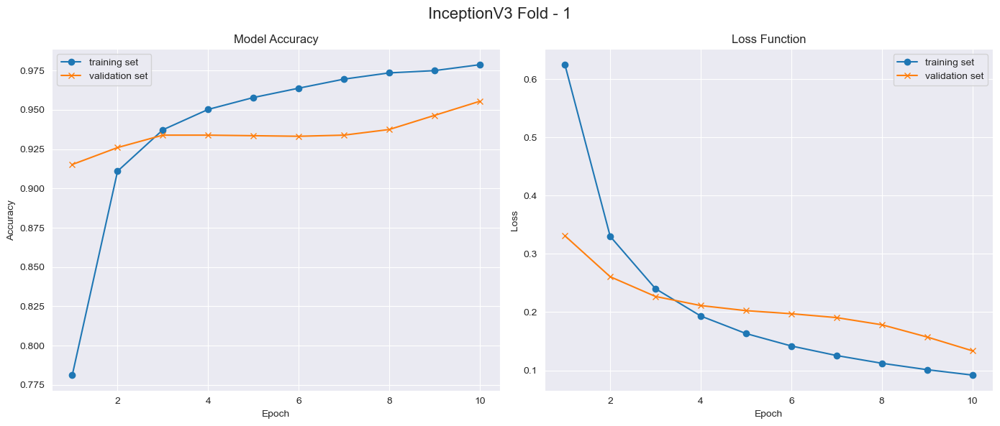

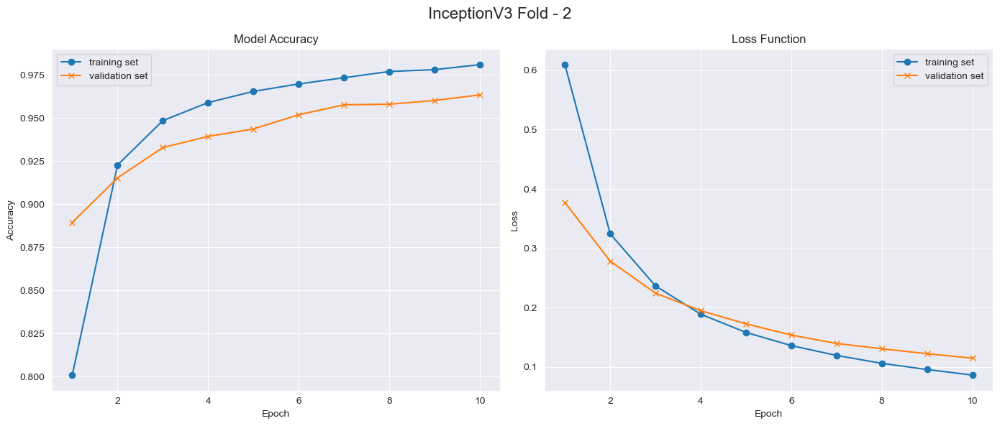

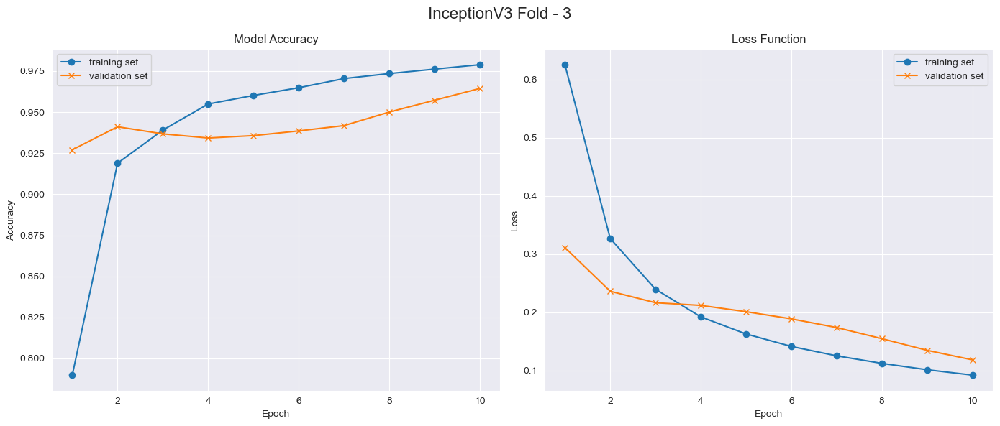

In [ ]:
def plot_fold_results(history, fold, model_name):
    """
    Plots accuracy and loss for a given fold
    """
    # ResNet and Inception have different keys (accuracy and acc)
    accuracy_key = 'accuracy' if 'accuracy' in history else 'acc'
    val_accuracy_key = 'val_accuracy' if 'val_accuracy' in history else 'val_acc'

    epochs = range(1, len(history[accuracy_key]) + 1)

    fig, ax = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle(f"{model_name} Fold - {fold}", fontsize=16)

    # Accuracy plot
    ax[0].plot(epochs, history[accuracy_key], label='training set', marker='o')
    ax[0].plot(epochs, history[val_accuracy_key], label='validation set', marker='x')
    ax[0].set_title('Model Accuracy')
    ax[0].set_xlabel('Epoch')
    ax[0].set_ylabel('Accuracy')
    ax[0].legend()
    ax[0].grid(True)

    # Loss plot
    ax[1].plot(epochs, history['loss'], label='training set', marker='o')
    ax[1].plot(epochs, history['val_loss'], label='validation set', marker='x')
    ax[1].set_title('Loss Function')
    ax[1].set_xlabel('Epoch')
    ax[1].set_ylabel('Loss')
    ax[1].legend()
    ax[1].grid(True)

    plt.tight_layout()
    plt.show()

for fold_idx, inception_history in enumerate(inception_histories, start=1):
    plot_fold_results(inception_history, fold=fold_idx, model_name="InceptionV3")


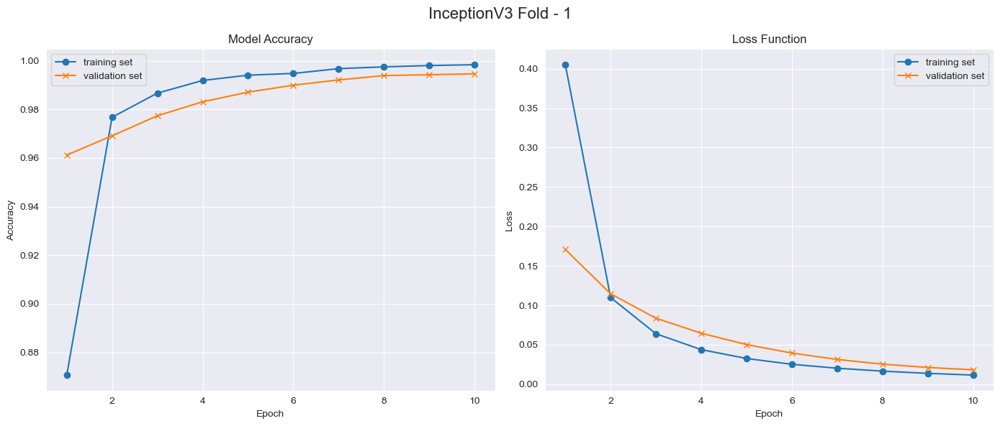

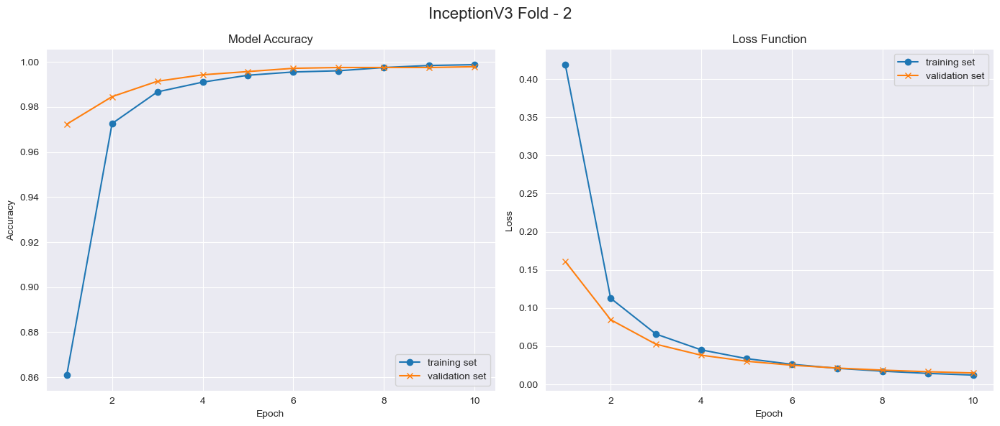

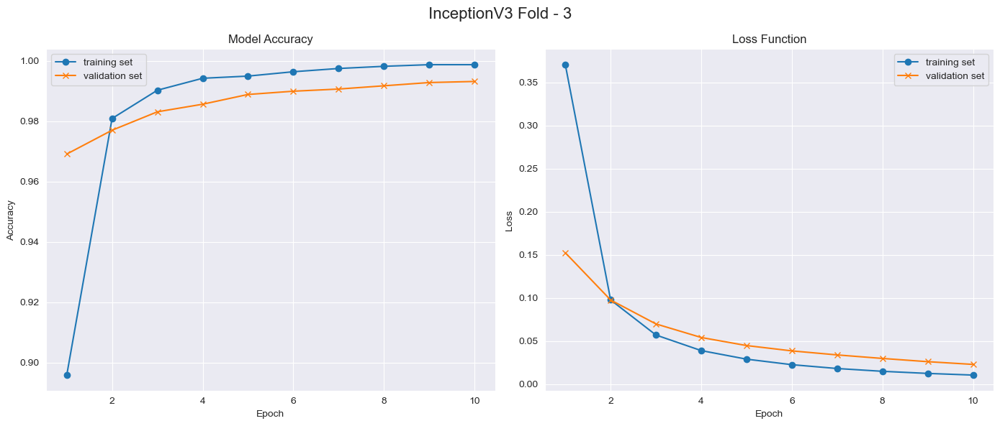

In [ ]:
# Graph needs to be updated to display ResNet-50
for fold_idx, inception_history in enumerate(resnet_histories, start=1):
    plot_fold_results(inception_history, fold=fold_idx, model_name="InceptionV3")

In [ ]:
import keras_tuner as kt
from tensorflow.keras.applications import ResNet50, InceptionV3

def inceptionV3_builder(hp):

    optimizer_choice = hp.Choice("optimizer", ["Adam", "SGD", "RMSprop"])

    base_model = InceptionV3(input_shape=(299, 299, 3), include_top=False, weights="imagenet")

    for layer in base_model.layers:
        layer.trainable = False

    x = layers.GlobalAveragePooling2D()(base_model.output)
    x = layers.Dense(hp.Int("dense_units", min_value=1024, max_value=4096, step=1024), activation="relu")(x)
    x = layers.Dropout(hp.Float("dropout_rate", 0.2, 0.6, step=0.1))(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

    model = Model(base_model.input, outputs=outputs)

    if optimizer_choice == 'RMSprop':
        optimizer = RMSprop(learning_rate=0.005)
    elif optimizer_choice == 'Adam':
        optimizer = Adam(learning_rate=0.005)
    elif optimizer_choice == 'SGD':
        optimizer = SGD(learning_rate=0.005, momentum=0.9)
    else:
        raise ValueError("Unsupported optimizer type. Choose 'RMSprop', 'Adam', or 'SGD'.")

    model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
    return model

def resnet50_builder(hp):
    optimizer_choice = hp.Choice("optimizer", ["Adam", "SGD", "RMSprop"])

    base_model = ResNet50(input_shape=(299, 299, 3), include_top=False, weights="imagenet")

    for layer in base_model.layers:
        layer.trainable = False

    x = layers.GlobalAveragePooling2D()(base_model.output)
    x = layers.Dense(hp.Int("dense_units", min_value=1024, max_value=4096, step=1024), activation="relu")(x)
    x = layers.Dropout(hp.Float("dropout_rate", 0.2, 0.6, step=0.1))(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

    model = Model(base_model.input, outputs=outputs)

    if optimizer_choice == 'RMSprop':
        optimizer = RMSprop(learning_rate=0.005)
    elif optimizer_choice == 'Adam':
        optimizer = Adam(learning_rate=0.005)
    elif optimizer_choice == 'SGD':
        optimizer = SGD(learning_rate=0.005, momentum=0.9)
    else:
        raise ValueError("Unsupported optimizer type. Choose 'RMSprop', 'Adam', or 'SGD'.")

    model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
    return model

IV3_tuner = kt.Hyperband(
    inceptionV3_builder,
    objective="val_accuracy",
    directory="model_tuning",
    project_name="IV3_tuning",
    max_epochs=EPOCHS
)

ResNet50_tuner = kt.Hyperband(
    resnet50_builder,
    objective="val_accuracy",
    directory="model_tuning",
    project_name="ResNet_tuning",
    max_epochs=EPOCHS
)

# Create data generators
train_gen = data_generator(X_train, y_train, BATCH_SIZE, preprocess_fn=inception_preprocess, augment=True)
val_gen = data_generator(X_val, y_val, BATCH_SIZE, preprocess_fn=inception_preprocess, augment=False)


IV3_tuner.search(train_gen, epochs=EPOCHS, validation_data=val_gen,steps_per_epoch=len(X_train) // BATCH_SIZE, validation_steps=len(X_val) // BATCH_SIZE)

best_IV3_hp = IV3_tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 14 Complete [00h 02m 00s]
val_accuracy: 0.9698275923728943

Best val_accuracy So Far: 0.9698275923728943
Total elapsed time: 00h 28m 31s

Search: Running Trial #15

Value             |Best Value So Far |Hyperparameter
Adam              |SGD               |optimizer
1024              |1024              |dense_units
0.3               |0.4               |dropout_rate
4                 |4                 |tuner/epochs
2                 |2                 |tuner/initial_epoch
2                 |2                 |tuner/bracket
1                 |1                 |tuner/round
0001              |0007              |tuner/trial_id

Epoch 3/4
 24/174 [===>..........................] - ETA: 33s - loss: 0.1421 - accuracy: 0.9467

KeyboardInterrupt: 

In [ ]:
best_IV3_model = IV3_tuner.hypermodel.build(best_IV3_hp)
best_IV3_model.evaluate(val_gen, steps=len(X_val) // BATCH_SIZE)

In [ ]:
ResNet50_tuner.search(train_gen, epochs=EPOCHS, validation_data=val_gen,steps_per_epoch=len(X_train) // BATCH_SIZE, validation_steps=len(X_val) // BATCH_SIZE)

best_ResNet_hp = ResNet50_tuner.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
best_ResNet50_model = ResNet50_tuner.hypermodel.build(best_ResNet_hp)
best_ResNet50_model.evaluate(val_gen, steps=len(X_val) // BATCH_SIZE)

In [ ]:
best_IV3_model.save("Tuned_Models/best_inception_model.h5")
best_ResNet50_model.save("Tuned_Models/best_resnet_model.h5")

print("models have been saved successfully")